**Data Visualization**

In [6]:
import numpy as np
import seaborn as sns
from ipywidgets import interact_manual
import plotly.express as px
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer

In [7]:
data = pd.read_csv('Healthcare Providers.csv')

In [8]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from ipywidgets import interact_manual
import plotly.express as px

C:\Users\DELL\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\DELL\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\DELL\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


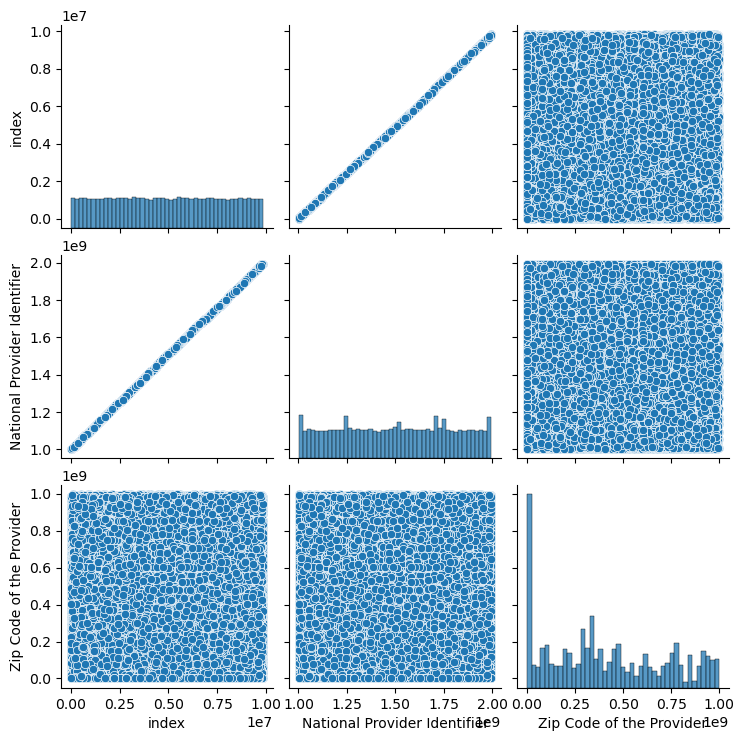

In [9]:
sns.pairplot(data)
plt.show()

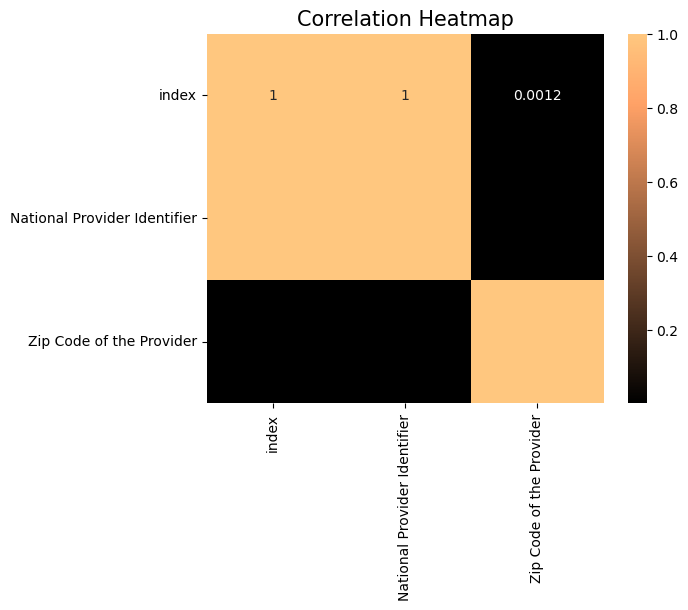

In [10]:
# Select only numeric columns from the dataset
numeric_data = data.select_dtypes(include=[np.number])

# Now generate the heatmap
sns.heatmap(numeric_data.corr(), annot=True, cmap='copper')
plt.title('Correlation Heatmap', fontsize=15)
plt.show()

C:\Users\DELL\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


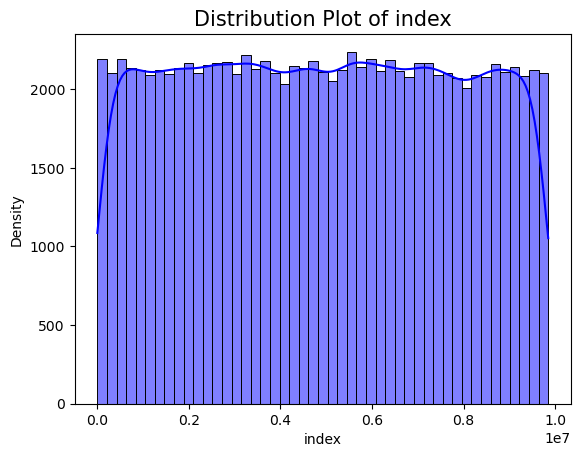

C:\Users\DELL\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


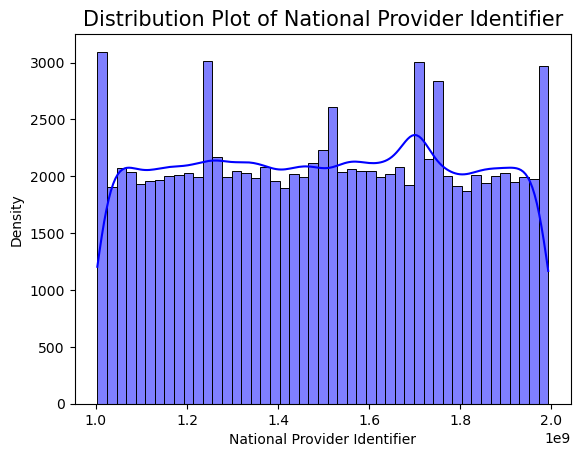

C:\Users\DELL\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


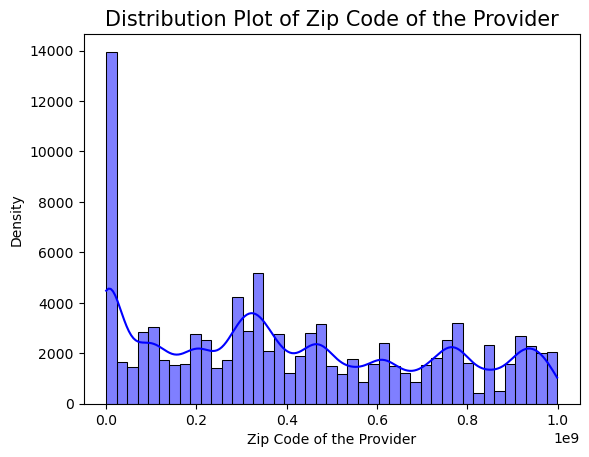

In [11]:
# Plot distplot for each numerical column in the dataset
numeric_data = data.select_dtypes(include=[np.number])

for col in numeric_data.columns:
    plt.figure()
    sns.histplot(data[col], kde=True, color='blue')
    plt.title(f'Distribution Plot of {col}', fontsize=15)
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.show()


**Interative Univariate Analysis**

In [12]:
pip install ipywidgets

Note: you may need to restart the kernel to use updated packages.


In [13]:
def plot_distribution(column):
    plt.figure(figsize=(10, 5))
    sns.histplot(df[column], kde=True, bins=20)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

In [14]:
# Get list of numerical columns
numerical_columns = data.select_dtypes(include='number').columns.tolist()

In [15]:
df1 = ['Last Name/Organization Name of the Provider','First Name of the Provider']
df1 = [col for col in df1 if col in data.columns and data[col].dtype == 'object']

In [16]:
def plot_categorical_distribution(column):
    if column in data.columns:
        plt.figure(figsize=(10, 5))
        sns.countplot(data=data, x=column, order=data[column].value_counts().index)
        plt.title(f'Distribution of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.xticks(rotation=45)
        plt.show()
    else:
        print(f"Column {column} not found in dataframe")

In [17]:
from ipywidgets import interact_manual

interact_manual(plot_categorical_distribution, column=numerical_columns)


interactive(children=(Dropdown(description='column', options=('index', 'National Provider Identifier', 'Zip Co…

<function __main__.plot_categorical_distribution(column)>

In [18]:
interact(plot_categorical_distribution, column=df1)

interactive(children=(Dropdown(description='column', options=('Last Name/Organization Name of the Provider', '…

<function __main__.plot_categorical_distribution(column)>

In [19]:
@interact_manual
def viz(x=list(data.select_dtypes('number').columns[1:]), y=list(data.select_dtypes('number').columns[1:])):
    plt.figure(figsize=(10, 5))
    sns.scatterplot(x=data[x], y=data[y])
    plt.title(f'{x} vs {y}')
    plt.xlabel(x)
    plt.ylabel(y)
    plt.xticks(rotation=45)
    plt.show()
#many types of plot: Strip,Violin,box,swarm

interactive(children=(Dropdown(description='x', options=('National Provider Identifier', 'Zip Code of the Prov…

In [20]:
pip install bubbly

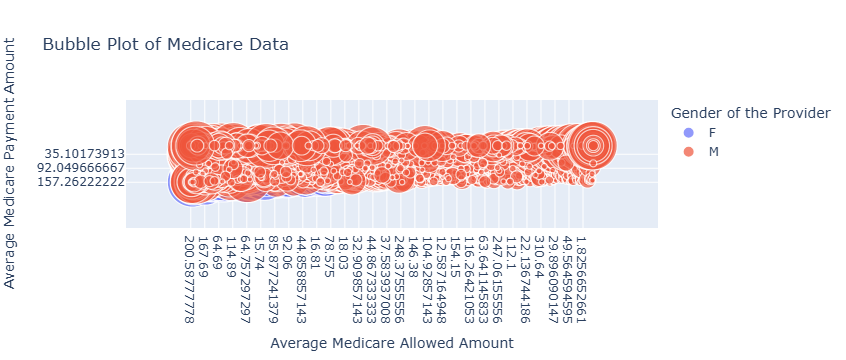

In [21]:
df = pd.DataFrame(data)

# Fill NaN values with 0 in 'Number of Medicare Beneficiaries'
df['Number of Medicare Beneficiaries'].fillna(0, inplace=True)

# Convert 'Number of Medicare Beneficiaries' to numeric and ensure no NaN values
df['Number of Medicare Beneficiaries'] = pd.to_numeric(df['Number of Medicare Beneficiaries'], errors='coerce')
df = df[df['Number of Medicare Beneficiaries'].notna()]  # Remove any rows with NaNs

# Filter out rows where 'Number of Medicare Beneficiaries' is zero or invalid
df = df[df['Number of Medicare Beneficiaries'] > 0]

# Encode gender for color mapping
label_encoder = LabelEncoder()
df['Gender Encoded'] = label_encoder.fit_transform(df['Gender of the Provider'])

# Create the static bubble plot
figure = px.scatter(df,
                    x='Average Medicare Allowed Amount',
                    y='Average Medicare Payment Amount',
                    size='Number of Medicare Beneficiaries',
                    color='Gender of the Provider',  # Color by gender
                    hover_name='National Provider Identifier',
                    title='Bubble Plot of Medicare Data',
                    size_max=50)

# Show the plot
figure.show()


In [22]:
if 'HCPCS Description' in data.columns:
    # Initialize the TF-IDF Vectorizer
    tfidf_vectorizer = TfidfVectorizer()

    # Fit and transform the HCPCS Description
    tfidf_matrix = tfidf_vectorizer.fit_transform(data['HCPCS Description'])

    # Convert the TF-IDF matrix to a DataFrame
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

    # Concatenate the original DataFrame with the TF-IDF features
    data = pd.concat([data, tfidf_df], axis=1)

    # Create a new column showing TF-IDF as a string for each row
    data['TF-IDF Representation'] = tfidf_df.apply(
        lambda row: ', '.join([f"{col}: {row[col]:.4f}" for col in tfidf_df.columns if row[col] > 0]),
        axis=1
    )

    # Display the updated DataFrame
    print(data[['HCPCS Description', 'TF-IDF Representation']].head())
else:
    print("Column 'HCPCS Description' does not exist in the DataFrame.")

                                   HCPCS Description  \
0  Initial hospital inpatient care, typically 70 ...   
1  Screening mammography, bilateral (2-view study...   
2  Established patient home visit, typically 25 m...   
3                            Urinalysis, manual test   
4  Injection beneath the skin or into muscle for ...   

                               TF-IDF Representation  
0  70: 0.4824, care: 0.3131, day: 0.3139, hospita...  
1  aided: 0.2911, bilateral: 0.2992, breast: 0.27...  
2  25: 0.4066, established: 0.3393, home: 0.6599,...  
3   manual: 0.6177, test: 0.4749, urinalysis: 0.6268  
4  beneath: 0.3767, diagnosis: 0.3449, for: 0.213...  


                                   HCPCS Description   01   01   10   10  100  \
0  Initial hospital inpatient care, typically 70 ...  0.0  0.0  0.0  0.0  0.0   
1  Screening mammography, bilateral (2-view study...  0.0  0.0  0.0  0.0  0.0   
2  Established patient home visit, typically 25 m...  0.0  0.0  0.0  0.0  0.0   
3                            Urinalysis, manual test  0.0  0.0  0.0  0.0  0.0   
4  Injection beneath the skin or into muscle for ...  0.0  0.0  0.0  0.0  0.0   

   100  1000  1000   11  ...  yeast  yeast  young  young  zinc  zinc  \
0  0.0   0.0   0.0  0.0  ...    0.0    0.0    0.0    0.0   0.0   0.0   
1  0.0   0.0   0.0  0.0  ...    0.0    0.0    0.0    0.0   0.0   0.0   
2  0.0   0.0   0.0  0.0  ...    0.0    0.0    0.0    0.0   0.0   0.0   
3  0.0   0.0   0.0  0.0  ...    0.0    0.0    0.0    0.0   0.0   0.0   
4  0.0   0.0   0.0  0.0  ...    0.0    0.0    0.0    0.0   0.0   0.0   

   zoledronic  zoledronic  zoster  zoster  
0         0.0         0.0     0.0   

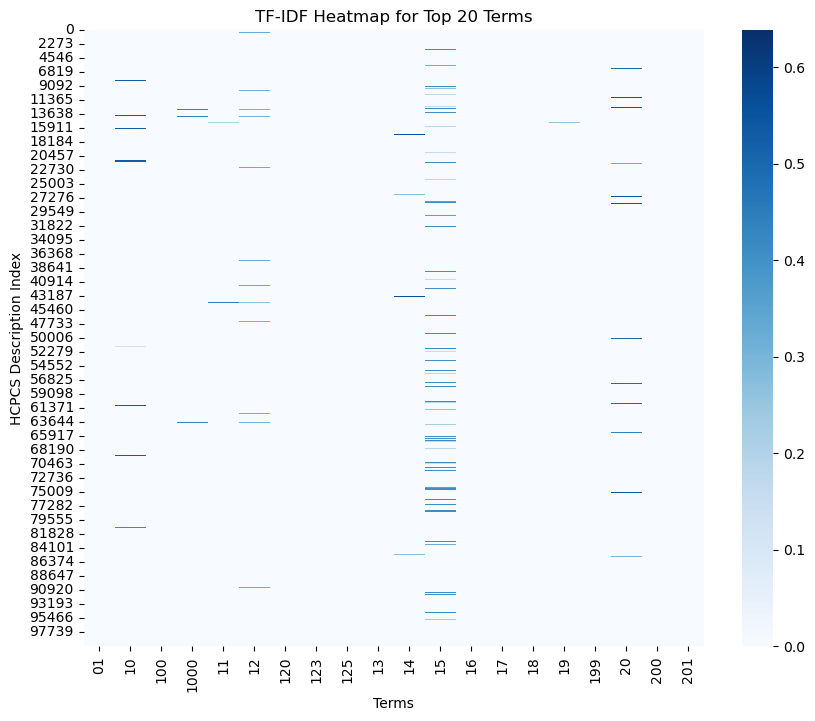

In [23]:
if 'HCPCS Description' in data.columns:
    # Initialize the TF-IDF Vectorizer
    tfidf_vectorizer = TfidfVectorizer()

    # Fit and transform the HCPCS Description
    tfidf_matrix = tfidf_vectorizer.fit_transform(data['HCPCS Description'])

    # Convert the TF-IDF matrix to a DataFrame
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

    # Concatenate the original DataFrame with the TF-IDF features
    data = pd.concat([data, tfidf_df], axis=1)

    # Display the first few rows of the TF-IDF matrix
    print(data[['HCPCS Description'] + list(tfidf_df.columns)].head())

    # Visualize the top 20 terms in a heatmap
    top_n_terms = 20  # Number of terms to visualize
    tfidf_subset = tfidf_df.iloc[:, :top_n_terms]

    # Create a heatmap using seaborn
    plt.figure(figsize=(10, 8))
    sns.heatmap(tfidf_subset, cmap="Blues", annot=False, cbar=True)
    plt.title("TF-IDF Heatmap for Top 20 Terms")
    plt.xlabel("Terms")
    plt.ylabel("HCPCS Description Index")
    plt.show()

else:
    print("Column 'HCPCS Description' does not exist in the DataFrame.")
